In [2]:
import torch
from sklearn.model_selection import train_test_split
from load_data import sim_arr

# reshape from batch, height, width, channel, to batch, channel, height, width
sim_arr_transformed = sim_arr.reshape(
    sim_arr.shape[0], sim_arr.shape[3], sim_arr.shape[1], sim_arr.shape[2])

sim_arr_tensor = torch.tensor(sim_arr_transformed, dtype=torch.float32)

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42, shuffle=True)

In [3]:
from torch import nn
import optuna

from search_space import search_space

study = optuna.load_study(study_name="vae_12", storage="sqlite:///optuna.db")

best_trial = study.best_trial
num_layers, poolsize, channels, kernel_sizes, dilations, activations = search_space(
    best_trial, 3, 12)

print(f"Best trial: {best_trial.number}")
print(f"num_layers: {num_layers}")
print(f"poolsize: {poolsize}")
print(f"channels: {channels}")
print(f"kernel_sizes: {kernel_sizes}")
print(f"dilations: {dilations}")
print(f"activations: {activations}")
print(f"learning_rate: {best_trial.params['lr']}")
print(f"batch_size: {best_trial.params['batch_size']}")
print(f"epochs: {best_trial.params['epochs']}")
print(f"Best value: {best_trial.value}")

Best trial: 70
num_layers: 5
poolsize: [2, 5, 2, 2, 2]
channels: [3, 11, 10, 10, 14, 12]
kernel_sizes: [12, 12, 16, 8, 9]
dilations: [1, 1, 1, 3, 4]
activations: [<class 'torch.nn.modules.activation.SELU'>, <class 'torch.nn.modules.activation.SELU'>, <class 'torch.nn.modules.activation.SELU'>, <class 'torch.nn.modules.activation.Softplus'>, <class 'torch.nn.modules.activation.Softplus'>]
learning_rate: 0.0006563521124277184
batch_size: 64
epochs: 200
Best value: 0.08203619396765763


/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 2, 2, 5] which is of type list.
  warnings.warn(message)
/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 2, 5, 2] which is of type list.
  warnings.warn(message)
/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 5, 2, 2] which is of type list.
  warnings.warn(message)
/home/tummalas/hyper-p

In [4]:
from vae import Encoder, Decoder, VarAutoEncoder
from cross_validation import cross_val, train_model, evaluate_model

best_trial = study.best_trial

encoder = Encoder(*search_space(best_trial, 3, 10))
decoder = Decoder(encoder)
model = VarAutoEncoder(encoder, decoder)

# if model exists, load it
try:
    model.load_state_dict(torch.load("vae_12.pth"))
except FileNotFoundError:
    train_model(model, train_data,
                lr=best_trial.params['lr'],
                batch_size=best_trial.params['batch_size'],
                epochs=best_trial.params['epochs'])
evaluate_model(model, test_data,
               batch_size=best_trial.params['batch_size'])

Test Loss: 0.0824


0.082415549437271

In [5]:
from torchsummary import summary
summary(model, input_size=(3, 80, 80))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
        Conv2dSame-1           [-1, 11, 80, 80]           4,763
              SELU-2           [-1, 11, 80, 80]               0
              SELU-3           [-1, 11, 80, 80]               0
         MaxPool2d-4           [-1, 11, 40, 40]               0
        Conv2dSame-5           [-1, 10, 40, 40]          15,850
              SELU-6           [-1, 10, 40, 40]               0
              SELU-7           [-1, 10, 40, 40]               0
         MaxPool2d-8             [-1, 10, 8, 8]               0
        Conv2dSame-9             [-1, 10, 8, 8]          25,610
             SELU-10             [-1, 10, 8, 8]               0
             SELU-11             [-1, 10, 8, 8]               0
        MaxPool2d-12             [-1, 10, 4, 4]               0
       Conv2dSame-13             [-1, 14, 4, 4]           8,974
         Softplus-14             [-1, 1

In [6]:
import numpy as np
import matplotlib.pyplot as plt

i = np.random.randint(0, len(test_data))
in_sim = test_data[i: i + 1]
in_sim = in_sim.to('cuda:0')
out_sim = model.reconstruct(in_sim)
in_sim = in_sim.detach().to('cpu').numpy()
in_sim = in_sim.reshape(
    in_sim.shape[0], in_sim.shape[2], in_sim.shape[3], in_sim.shape[1])
out_sim = out_sim[0].detach().to('cpu').numpy()
out_sim = out_sim.reshape(
    out_sim.shape[0], out_sim.shape[2], out_sim.shape[3], out_sim.shape[1])
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(in_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")
ax[1].imshow(out_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")

IndexError: tuple index out of range

In [ ]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture

mu, _ = model.encoder(sim_arr_tensor.to('cuda'))
feature_array = mu.detach().to('cpu').numpy()

print(feature_array.shape)

feature_array = (feature_array - feature_array.mean()) / feature_array.std()

def objective(trial):
    n_components = trial.suggest_int('n_components', 2, 20)
    covariance_type = trial.suggest_categorical(
        'covariance_type', ['full', 'tied', 'diag', 'spherical'])
    init_params = trial.suggest_categorical(
        'init_params', ['kmeans', 'random'])
    gmm = GaussianMixture(n_components=n_components,
                          covariance_type=covariance_type,
                          random_state=42,
                          init_params=init_params,
                          max_iter=1000)
    gmm.fit(feature_array)
    labels = gmm.predict(feature_array)
    return gmm.bic(feature_array)


study = optuna.create_study(
    study_name='gmm_dis', storage='sqlite:///vae.db', direction='minimize', load_if_exists=True)
study.optimize(objective, n_trials=100)

[I 2024-07-18 02:10:54,506] A new study created in RDB with name: gmm_dis


(3010, 10)


[I 2024-07-18 02:10:54,785] Trial 0 finished with value: 11758.7146896597 and parameters: {'n_components': 10, 'covariance_type': 'diag', 'init_params': 'kmeans'}. Best is trial 0 with value: 11758.7146896597.
[I 2024-07-18 02:10:54,933] Trial 1 finished with value: -24169.27351065744 and parameters: {'n_components': 2, 'covariance_type': 'full', 'init_params': 'random'}. Best is trial 1 with value: -24169.27351065744.
[I 2024-07-18 02:10:55,315] Trial 2 finished with value: -111432.84935002222 and parameters: {'n_components': 14, 'covariance_type': 'full', 'init_params': 'random'}. Best is trial 2 with value: -111432.84935002222.
[I 2024-07-18 02:10:55,713] Trial 3 finished with value: 1889.047254981248 and parameters: {'n_components': 4, 'covariance_type': 'tied', 'init_params': 'kmeans'}. Best is trial 2 with value: -111432.84935002222.
[I 2024-07-18 02:10:55,888] Trial 4 finished with value: -57719.78683926701 and parameters: {'n_components': 3, 'covariance_type': 'full', 'init_par

In [ ]:
best_trial = study.best_trial
n_components = best_trial.params['n_components']
covariance_type = best_trial.params['covariance_type']
init_params = best_trial.params['init_params']

print(f"Best trial: {best_trial.number}")
print(f"covariance_type: {covariance_type}")
print(f"init_params: {init_params}")
print(f"BIC: {best_trial.value}")

gmm = GaussianMixture(n_components=n_components,
                      covariance_type=covariance_type,
                      random_state=42,
                      init_params=init_params,
                      max_iter=1000)
gmm.fit(feature_array)
labels = gmm.predict(feature_array)

# save labels
np.save('labels.npy', labels)

Best trial: 14
covariance_type: full
init_params: random
BIC: -132626.7590594862


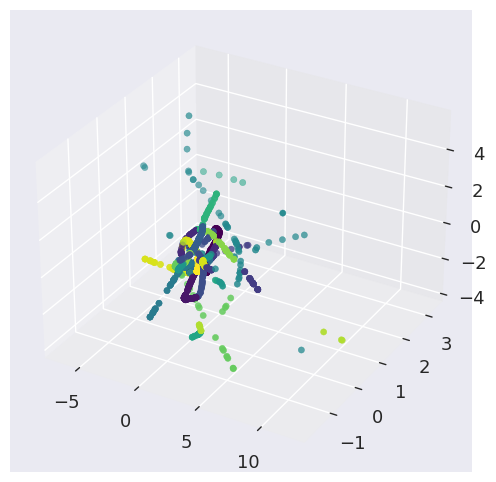

In [ ]:
# plot the feature array in 3D with the labels as colors

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# feature_array = feature_array[0].detach().to('cpu').numpy()
ax.scatter(feature_array[:, 0], feature_array[:, 1],
           feature_array[:, 2], c=labels)

In [ ]:
from cluster_acc import adj_rand_index, purity

# load true labels
true_labels = np.load('labels.npy')

print("Adjusted Rand Index: ", adj_rand_index(labels, true_labels))
print("Purity: ", purity(labels, true_labels))

Adjusted Rand Index:  [-2.12795631 -2.21645901 -1.99182045 ... -1.9804275  -1.9804275
 -1.9804275 ]
Purity:  1.0


In [ ]:
import plotly.express as ptx
import plotly.graph_objs as go
from load_data import parameters_dict, simulation_file_paths
print(len(set(labels)) - (1 if -1 in labels else 0))


class_dict = {f"Class {i}": list() for i in range(len(set(labels)))}
class_dict["Outliers"] = list()
for index, path in enumerate(simulation_file_paths):
    class_ = labels[index]
    if class_ == -1:
        class_dict["Outliers"].append(str(path))
    else:
        class_dict[f"Class {class_}"].append(str(path))

traces = list()
for class_id, colour in zip(class_dict, ptx.colors.qualitative.Dark24):
    traces.append(
        go.Scatter(
            x=[
                parameters_dict[f]["H"]
                for f in class_dict[class_id]
            ],
            y=[
                parameters_dict[f]["E"]
                for f in class_dict[class_id]
            ],
            mode="markers",
            name=class_id,
            opacity=0.7,
            marker=dict(
                size=11,
                color=colour,
            ),
        )
    )

fig = go.Figure(data=traces)
fig.update_layout(
    autosize=False,
    width=990,
    height=600,
    margin=dict(
        l=10,
        r=10,
        b=25,
        t=25,
    ),
    xaxis_title=r"$\mu_0 \mathbf{H} \text{ (T)}$",
    yaxis_title=r"$\Delta \text{E (J)}$",
)

18


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#2E91E5', 'size': 11},
              'mode': 'markers',
              'name': 'Class 0',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [0.6094349595627404, 0.7528928307335971, 0.4971364459437102,
                    0.7464990043310208, 0.8027673907963068, 1.1603903092753214,
                    1.1086917079049514, 0.9861663886355949, 1.1071872073552032,
                    0.9130732008672463, 1.1120120774019429, 1.1735348343250152,
                    0.5975447174747467, 1.0250054051919253, 0.869261412570817,
                    0.46669098222518246, 1.1305127224462546, 0.7571489064156133,
                    0.9935376695424457, 0.8519665292898678, 1.0465188935411227,
                    1.0718182521919446, 0.746403496136002, 0.5020079073917587,
                    0.4693248327960347, 0.6516358443230307, 0.6848079906719802,
                    1.1955561140906563, 0.7506798559997826, 1.1665884152288912,
                    0.5238139349280231, 0.6273185104758006, 1.1770707825786892,
                    0.9698279207025753, 0.6699039315395161, 0.4944378982150204,
                    0.8115632219784964, 0.8202076505365383, 0.4780707630550361,
                    0.554693781571518, 0.600253287454197, 1.1814759805272004,
                    0.5097030848111216, 0.8197104804685906, 0.55779369174165,
                    0.9553442344939065, 0.9951803409357836, 0.6083172423355067,
                    1.1929253724128137, 0.7140948789521357, 0.9269515687798381,
                    0.9813592490631781, 0.7453627241490277, 0.5851306000927129,
                    1.1122117803842337, 0.9898962581019028, 0.5823933515367479,
                    0.8637599795213791, 0.9742161584909454, 0.43261990503454334,
                    1.140888569640036, 0.6436569429674269, 1.1661932580993006,
                    0.6110638646468093, 0.4235723325794434, 0.7015080933424875,
                    0.7179679094332169, 0.4393863195773499, 0.6546227281234838,
                    0.809569514778482, 0.5814367798799912, 0.4214280801625913,
                    1.112307266850654, 0.4536938722500533, 0.7897525671244984,
                    0.6052580022217073, 1.0976181620612193, 0.5151353728160908,
                    0.599718986535895, 0.7302987445748806, 0.9641370033042524,
                    1.0469586493867697, 0.6048755537013771, 1.0515676079188805,
                    0.5536843308215675, 0.7327626429589381, 0.7108584663581602,
                    1.1141259767768092, 1.0274713182492725, 0.7983981074624066,
                    0.6286693467032295, 0.6138269565112984, 0.8160392176894741,
                    1.1947724585988408, 0.9646048372886914, 0.6997767539785071,
                    1.0485608360241712, 0.6162651446715482, 0.8850705377887228,
                    1.0202856143980115, 0.9864011704620863, 0.6873601795375328,
                    0.6218801135687254, 0.7867600810417402, 0.657065121899311,
                    1.0520917899467686, 0.6045283471970404, 0.6207519568266823,
                    1.0847157664043714, 0.6594397013397775, 0.8362432922424539,
                    0.8775627476181801, 0.9448716255746837, 0.4175134329531739,
                    1.1469998419153746, 0.6587923843405451, 0.9808002518152286,
                    0.6486426687537004, 0.471480948213937, 0.6018498694066258,
                    0.9066727290485987, 0.9440337622094458, 0.6597066901473676,
                    0.8028197934355251, 0.8081036758866661, 0.9249011197760583,
                    0.4265244232267176, 0.4497821356648899, 0.7526268782292636,
                    1.116615272717344, 0.6238164836260325, 0.5948508103140394,
                    0.836415867916509, 0.5283336911667161, 1.1827621140750701,
                    0.6570880888695172, 1.0934684341269973, 0.7038115819871134,
                    0.7474323434833914, 0.5073136042405212, 0.4580104783438778,
                    0.8204690678947646, 1.06361665703973

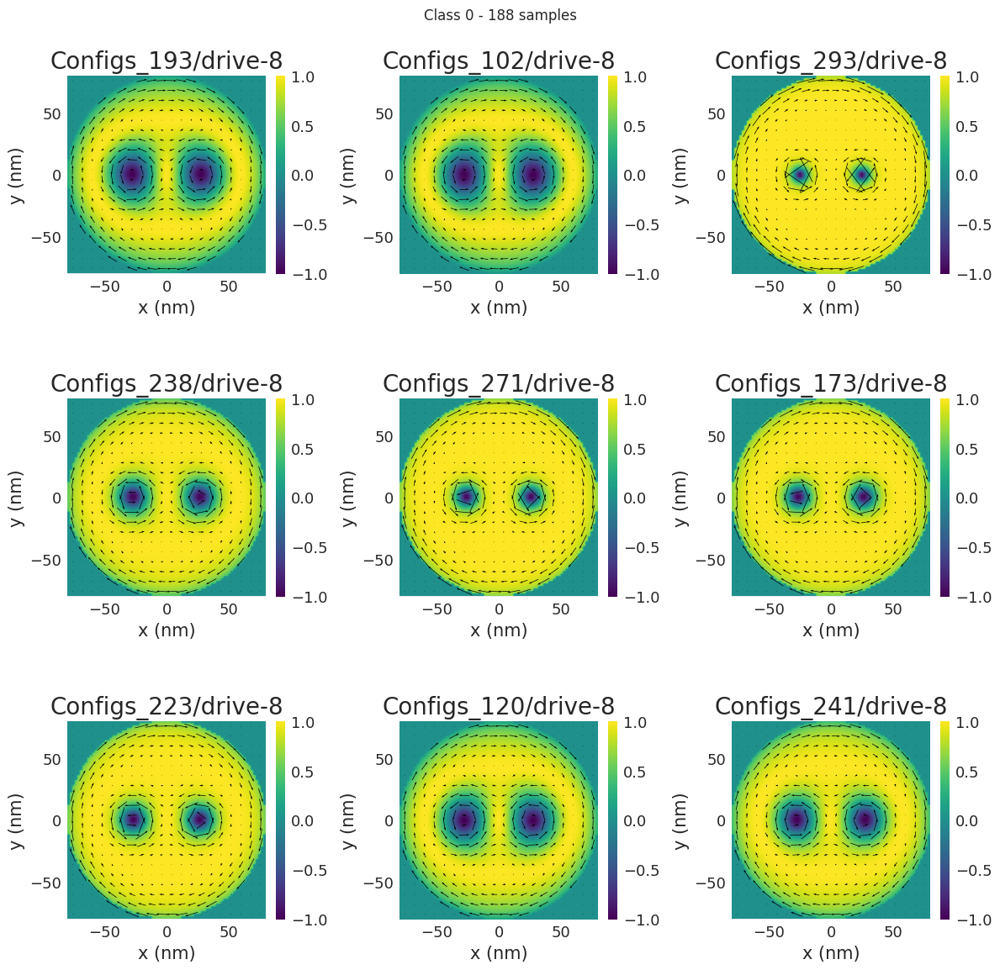

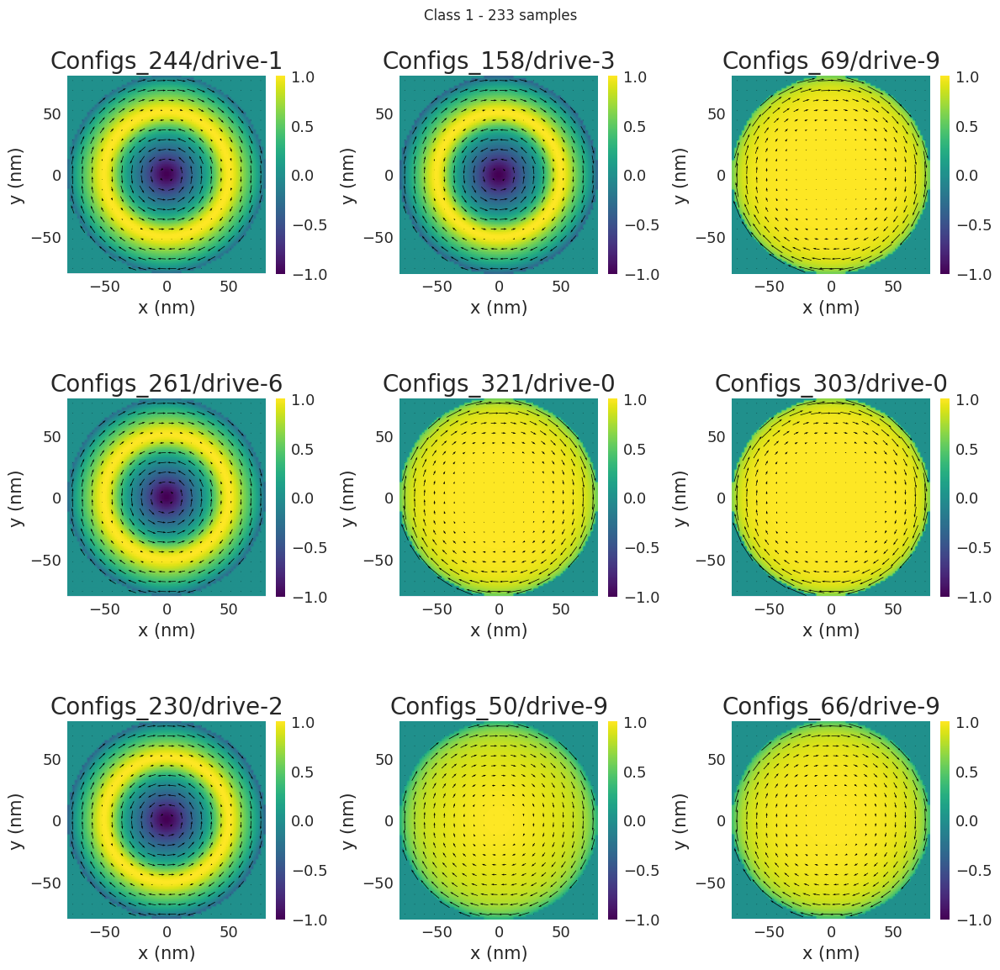

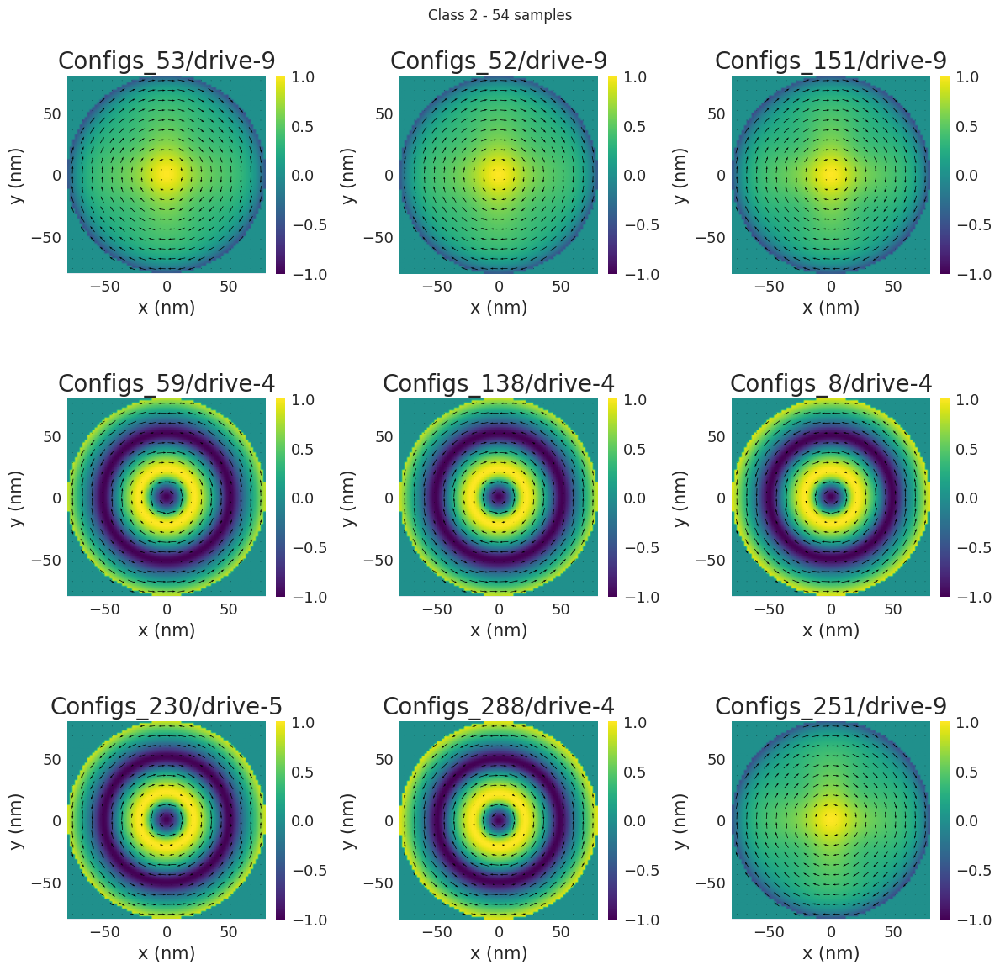

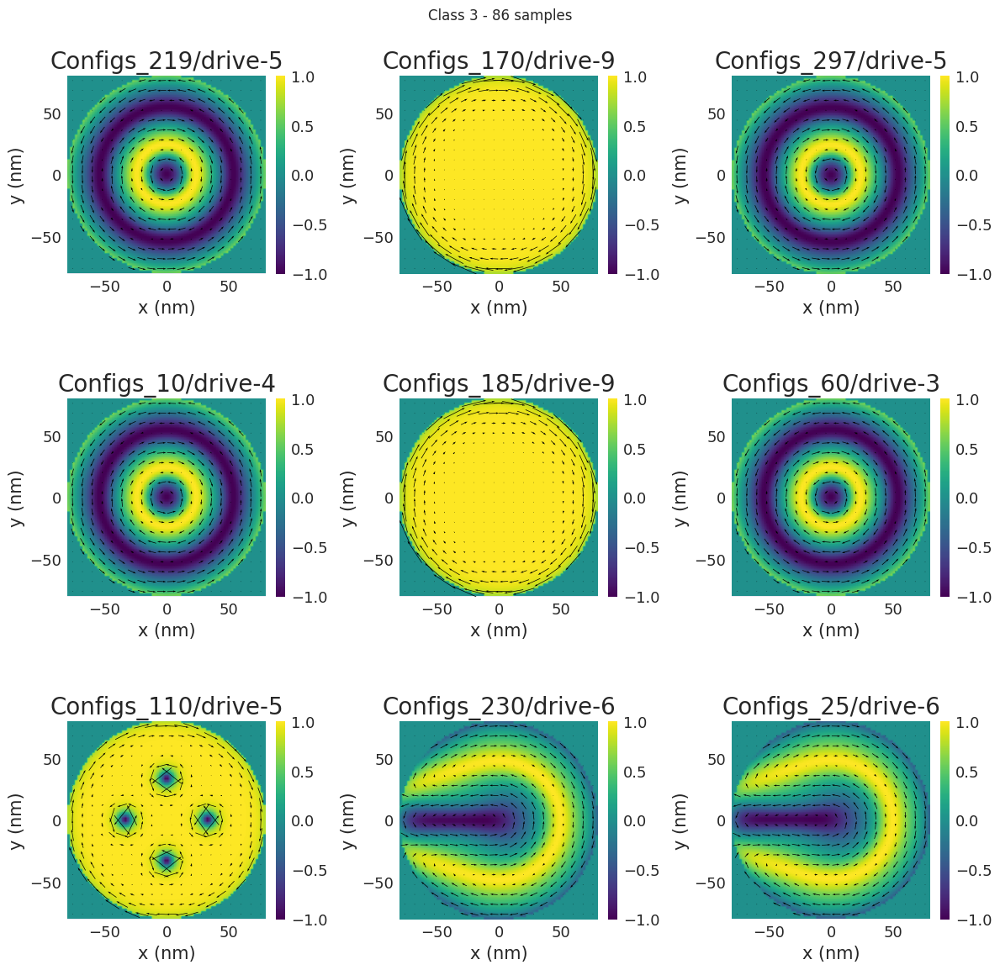

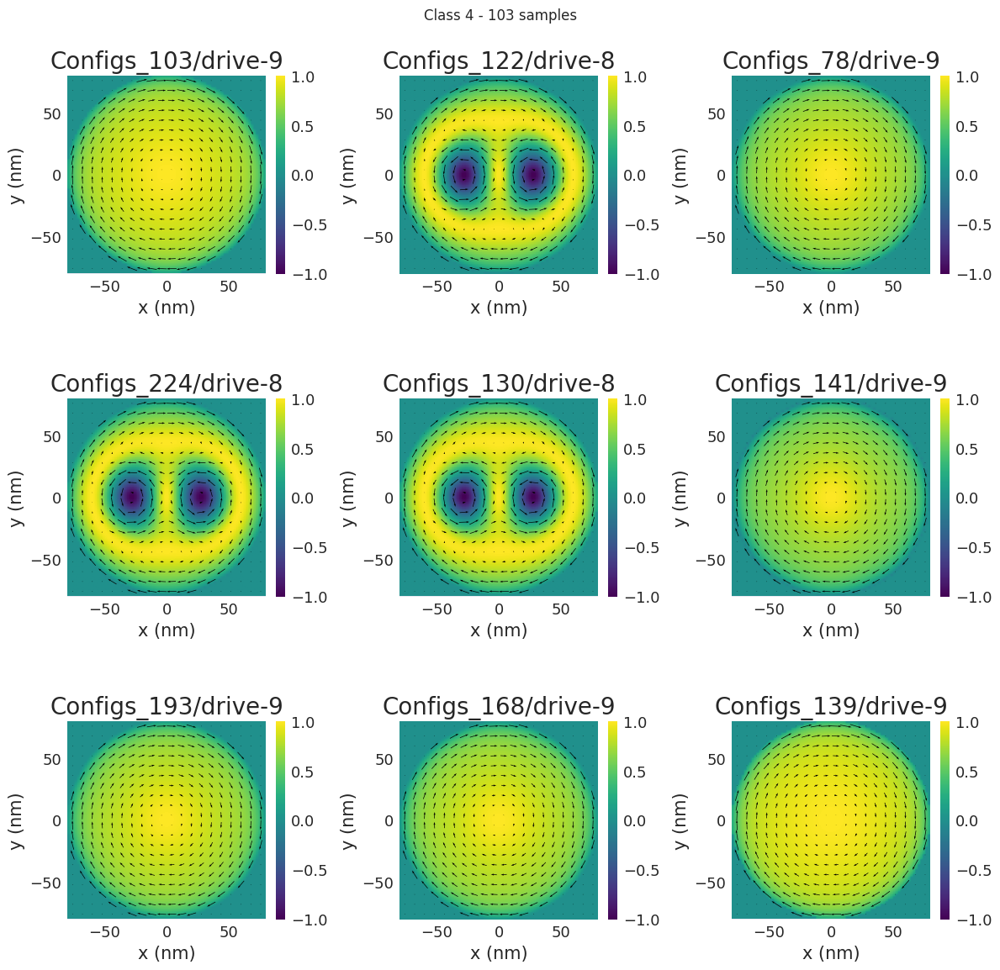

...

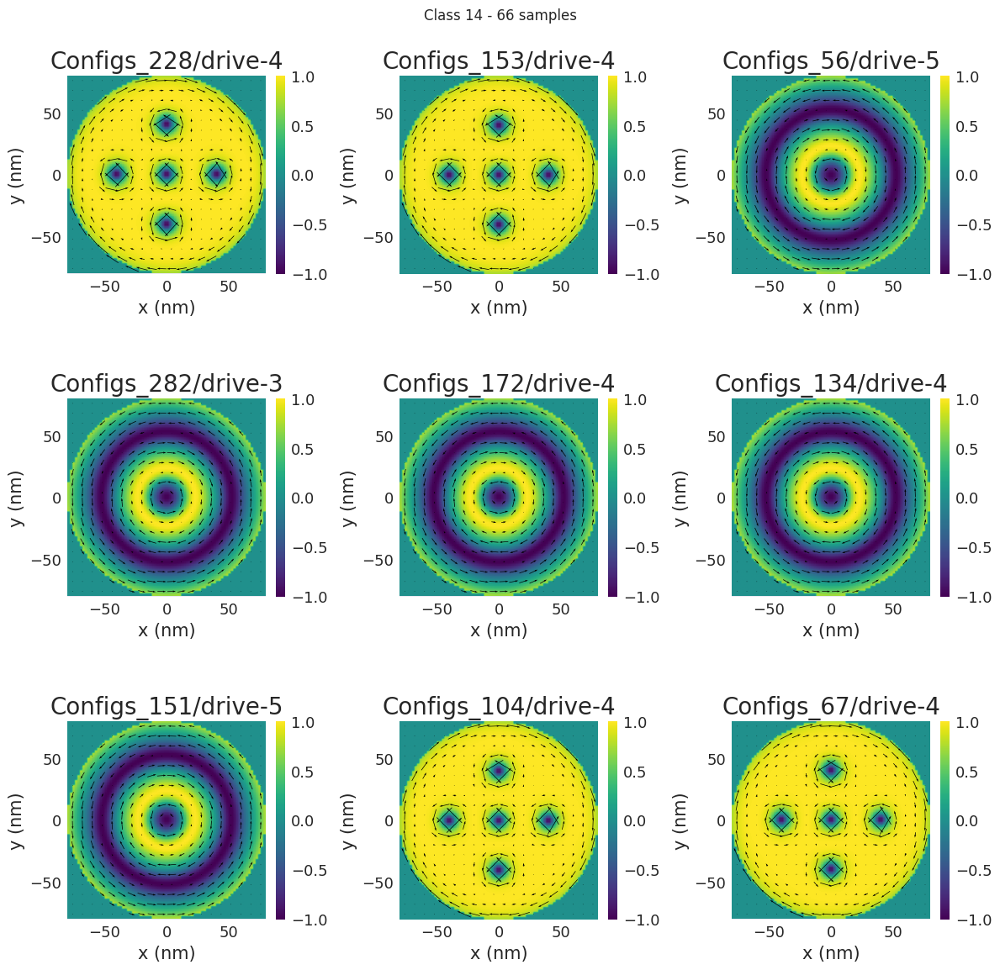

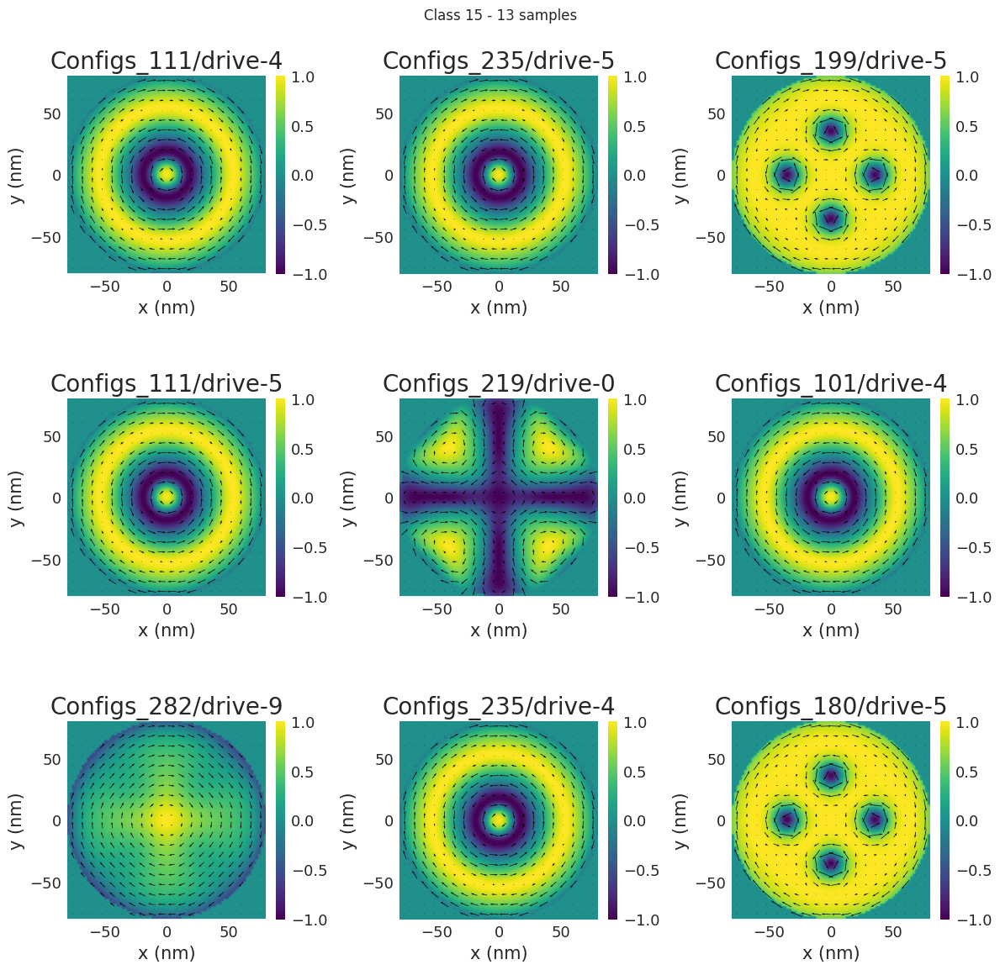

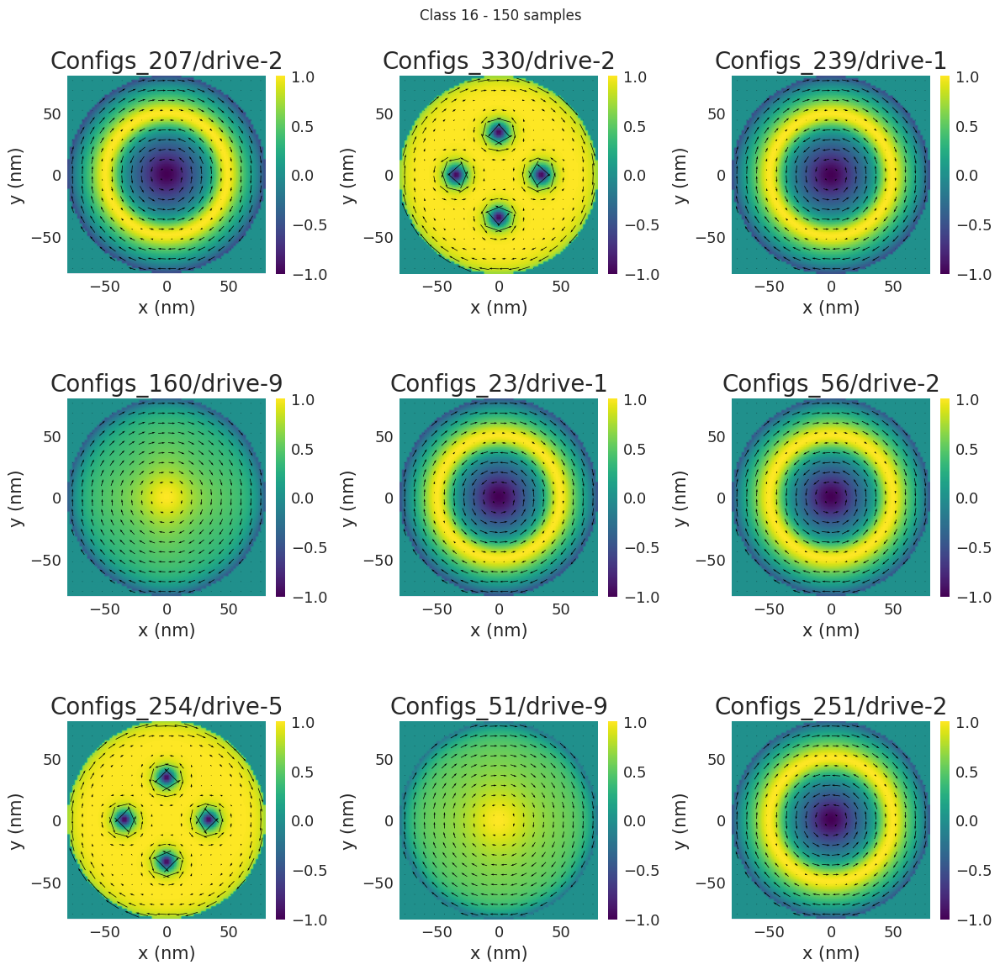

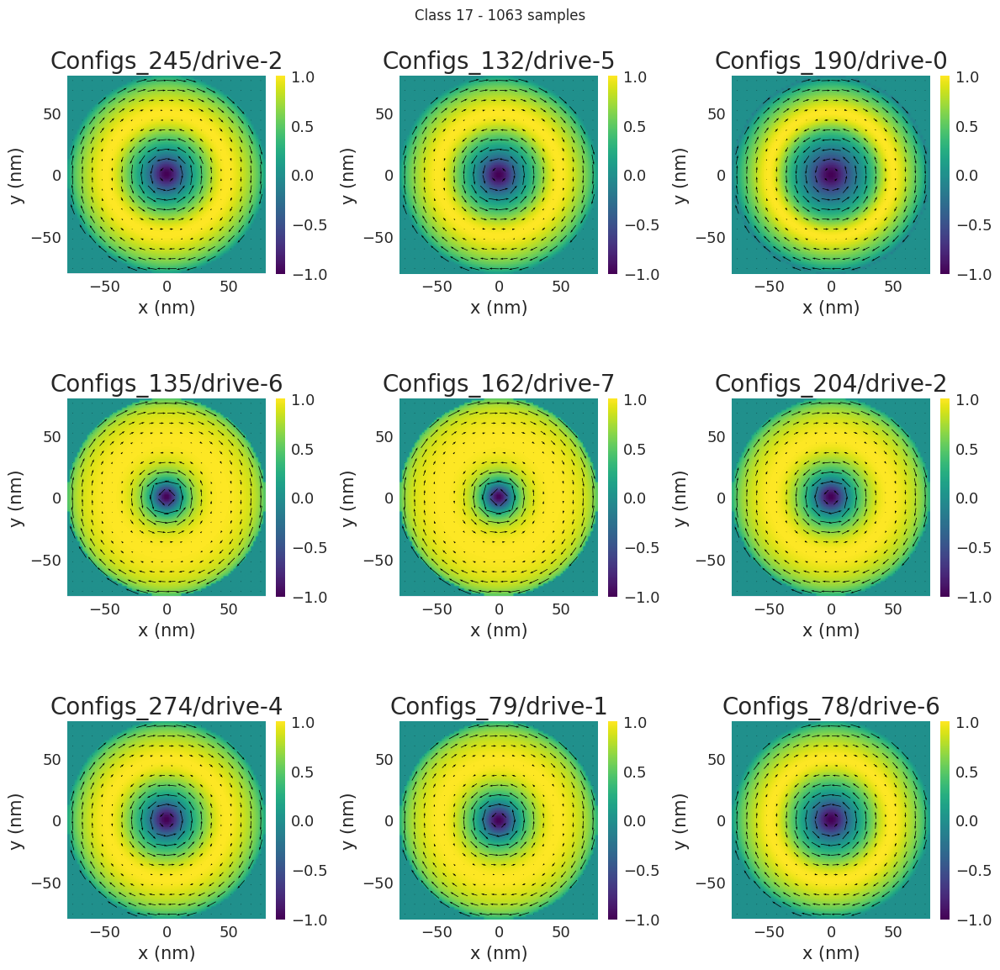

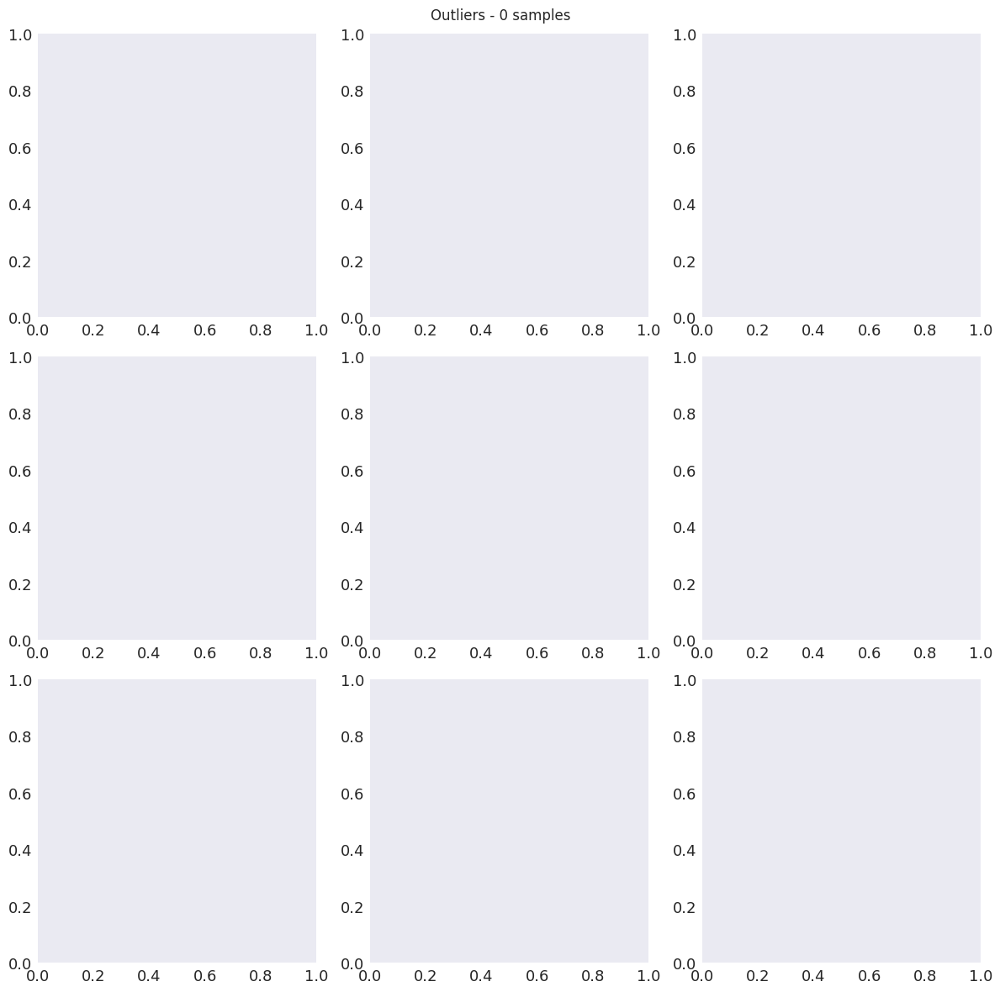

In [ ]:
from plotting import plot_all_examples

plot_all_examples(class_dict, parameters_dict)